# EDA

In [1]:
import os
import warnings

from datetime import datetime
import itertools

import numpy as np
import pandas as pd

from fbprophet import Prophet
from fbprophet.diagnostics import cross_validation, performance_metrics
from fbprophet.plot import plot_plotly

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib import rc

# plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False

pd.set_option('display.max_row', 200)
pd.set_option('display.max_column', 37)
warnings.filterwarnings(action='ignore')

## matplotlib 한글 폰트 설정

In [2]:
data = np.random.randint(-100, 100, 50).cumsum()
data

array([-17, -17, -34,  43,  75,  91,  67,  30,  92, 104, 100,  37, 130,
       155, 123, 195, 131, 109,  28, -19, -83, -44,  44,  63,  68,   0,
        17, -44,  49,  75,  25, -28, -35,  22,  74, -22,  35,  85,  39,
        65,   9, -65, -19, -19,  10,  63,  11, -81,  17, -36])

In [3]:
print('version : ', mpl.__version__)
print('location : ', mpl.__file__)
print('config location : ', mpl.get_configdir())
print('cache location : ', mpl.get_cachedir())

version :  3.5.1
location :  /opt/conda/lib/python3.8/site-packages/matplotlib/__init__.py
config location :  /root/.config/matplotlib
cache location :  /root/.cache/matplotlib


In [4]:
print('config file dir : ', mpl.matplotlib_fname())

config file dir :  /opt/conda/lib/python3.8/site-packages/matplotlib/mpl-data/matplotlibrc


In [5]:
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
print(len(font_list))

10


In [6]:
font_list

['/usr/share/fonts/truetype/nanum/NanumGothic.ttf',
 '/usr/share/fonts/truetype/dejavu/DejaVuSansMono.ttf',
 '/usr/share/fonts/truetype/dejavu/DejaVuSerif.ttf',
 '/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicLight.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicBold.ttf',
 '/usr/share/fonts/truetype/nanum/NanumGothicExtraBold.ttf',
 '/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf',
 '/usr/share/fonts/truetype/dejavu/DejaVuSansMono-Bold.ttf',
 '/usr/share/fonts/truetype/dejavu/DejaVuSerif-Bold.ttf']

현재 설정되어 있는 폰트 정보확인

In [7]:
print('font size : ', plt.rcParams['font.size'])
print('font : ', plt.rcParams['font.family'])

font size :  10.0
font :  ['sans-serif']


In [8]:
path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
font_name = fm.FontProperties(fname=path, size=10).get_name()
print(font_name)
plt.rc('font', family=font_name)

NanumGothic


# Load Data

In [9]:
DATA_DIR = os.path.abspath(os.path.dirname('EDA.ipynb') + 'data' + '/EDA')

In [10]:
train_df = pd.read_csv(os.path.join(DATA_DIR, 'train', 'train.csv'))
valid_df = pd.read_csv(os.path.join(DATA_DIR, 'train', 'validate.csv'))
test_df = pd.read_csv(os.path.join(DATA_DIR, 'test', 'test.csv'))

In [11]:
def convert(date):
    return date[:4] + '-' + date[4:6] + '-' + date[6:]

def date_to_timestamp(df):
    new_df = df.copy()
    
    date_series = new_df['날짜'].astype(str).map(convert)
    time_series = new_df['시간'].astype(str).map(lambda x: ' ' + x.zfill(2) + ':00:00')
    
    new_df['날짜'] = date_series + time_series
    
    new_df['날짜'] = pd.to_datetime(new_df['날짜'])
    new_df.drop(['시간'], axis=1, inplace=True)
    
    return new_df

In [12]:
train = date_to_timestamp(train_df)
valid = date_to_timestamp(valid_df)
test = date_to_timestamp(test_df)

In [13]:
# train + valid
new_train = pd.concat([train, valid[168:]])

# 도로별 EDA

In [14]:
highway_num = list(new_train.columns[1:])

In [15]:
highway_name = ['경부선', '남해선(순천-부산)', '남해선(영암-순천)', '광주대구선', '무안광주선', '고창담양선', '서해안선', '울산선', '대구포항선','익산장수선', '호남선',
'순천완주선', '청주영덕선', '당진대전선', '통영대전선', '중부선', '제2 중부선', '평택제천선', '중부내륙선', '영동선', '중앙선', '서울양양선', '동해선(삼척-속초)', '동해선(부산-포항)',
'서울외곽순환선', '남해1지선', '남해2지선', '제2경인선', '경인선', '서천공주선', '호남지선', '대전남부선', '중부내륙지선', '중앙선지선', '부산외곽선']

In [16]:
for num, road in zip(highway_num, highway_name):
    print('번호 : ', num, ' / ', road)


번호 :  10  /  경부선
번호 :  100  /  남해선(순천-부산)
번호 :  101  /  남해선(영암-순천)
번호 :  120  /  광주대구선
번호 :  121  /  무안광주선
번호 :  140  /  고창담양선
번호 :  150  /  서해안선
번호 :  160  /  울산선
번호 :  200  /  대구포항선
번호 :  201  /  익산장수선
번호 :  251  /  호남선
번호 :  270  /  순천완주선
번호 :  300  /  청주영덕선
번호 :  301  /  당진대전선
번호 :  351  /  통영대전선
번호 :  352  /  중부선
번호 :  370  /  제2 중부선
번호 :  400  /  평택제천선
번호 :  450  /  중부내륙선
번호 :  500  /  영동선
번호 :  550  /  중앙선
번호 :  600  /  서울양양선
번호 :  650  /  동해선(삼척-속초)
번호 :  652  /  동해선(부산-포항)
번호 :  1000  /  서울외곽순환선
번호 :  1020  /  남해1지선
번호 :  1040  /  남해2지선
번호 :  1100  /  제2경인선
번호 :  1200  /  경인선
번호 :  1510  /  서천공주선
번호 :  2510  /  호남지선
번호 :  3000  /  대전남부선
번호 :  4510  /  중부내륙지선
번호 :  5510  /  중앙선지선
번호 :  6000  /  부산외곽선


In [17]:
highway_info = dict(zip(highway_num, highway_name))

---

# Road clustering
tslearn docs
- https://tslearn.readthedocs.io/en/stable/gen_modules/clustering/tslearn.clustering.TimeSeriesKMeans.html
- https://tslearn.readthedocs.io/en/stable/auto_examples/clustering/plot_kmeans.html#sphx-glr-auto-examples-clustering-plot-kmeans-py

reference
- https://tootouch.github.io/contest%20review/kdx_dashboard_part2/
- https://tslearn.readthedocs.io/en/stable/variablelength.html#clustering

# visualize clustring

In [162]:
def road_clustering(t_dataset, n_clusters=3, metric='dtw', verbose=False):
    t_dataset = TimeSeriesScalerMeanVariance().fit_transform(t_dataset)

    print('DBA k-means')

    dba_km = TimeSeriesKMeans(n_clusters=n_clusters,
                              metric=metric,
                              verbose=verbose
                             )

    y_pred = dba_km.fit_predict(t_dataset)
    
    plt.figure(figsize=(30, 15))
    
    for yi in range(n_clusters):
        plt.subplot(3, 3, yi+1)
        for xx in t_dataset[y_pred == yi]:
            plt.plot(xx.ravel(), 'k-', alpha=.2)
        plt.plot(dba_km.cluster_centers_[yi].ravel(), 'r-')
    
    road_clustring_dict = collections.defaultdict(list)


    for road_num, label, road_name in zip(highway_num, y_pred, highway_name):
        road_clustring_dict[label].append((road_num, road_name))
    
    return road_clustring_dict

## Cluster 3 visualization

DBA k-means


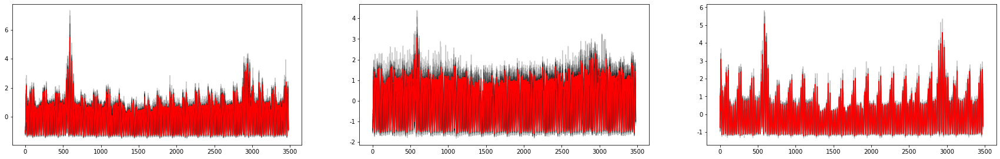

In [169]:
road_clustring_3 = road_clustering(t_dataset, n_clusters=3, verbose=False)

In [175]:
for key, values in road_clustring_3.items():
    print(f'cluster num : {key}  road nums : {len(values)} \n road : {values}\n')

cluster num : 1  road nums : 16 
 road : [('10', '경부선'), ('100', '남해선(순천-부산)'), ('150', '서해안선'), ('352', '중부선'), ('370', '제2 중부선'), ('400', '평택제천선'), ('450', '중부내륙선'), ('500', '영동선'), ('1000', '서울외곽순환선'), ('1040', '남해2지선'), ('1100', '제2경인선'), ('1200', '경인선'), ('3000', '대전남부선'), ('4510', '중부내륙지선'), ('5510', '중앙선지선'), ('6000', '부산외곽선')]

cluster num : 0  road nums : 13 
 road : [('101', '남해선(영암-순천)'), ('120', '광주대구선'), ('121', '무안광주선'), ('140', '고창담양선'), ('160', '울산선'), ('201', '익산장수선'), ('251', '호남선'), ('270', '순천완주선'), ('301', '당진대전선'), ('550', '중앙선'), ('652', '동해선(부산-포항)'), ('1020', '남해1지선'), ('2510', '호남지선')]

cluster num : 2  road nums : 6 
 road : [('200', '대구포항선'), ('300', '청주영덕선'), ('351', '통영대전선'), ('600', '서울양양선'), ('650', '동해선(삼척-속초)'), ('1510', '서천공주선')]



## Cluster 4 visualization

DBA k-means


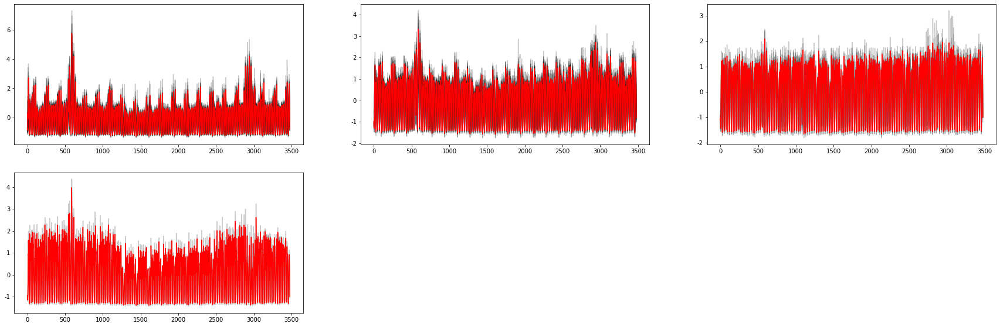

In [165]:
road_clustring_4 = road_clustering(t_dataset, n_clusters=4, verbose=False)

In [176]:
for key, values in road_clustring_4.items():
    print(f'cluster num : {key}  road nums : {len(values)} \n road : {values}\n')

cluster num : 1  road nums : 13 
 road : [('10', '경부선'), ('100', '남해선(순천-부산)'), ('121', '무안광주선'), ('150', '서해안선'), ('160', '울산선'), ('251', '호남선'), ('352', '중부선'), ('370', '제2 중부선'), ('400', '평택제천선'), ('450', '중부내륙선'), ('500', '영동선'), ('1020', '남해1지선'), ('2510', '호남지선')]

cluster num : 0  road nums : 14 
 road : [('101', '남해선(영암-순천)'), ('120', '광주대구선'), ('140', '고창담양선'), ('200', '대구포항선'), ('201', '익산장수선'), ('270', '순천완주선'), ('300', '청주영덕선'), ('301', '당진대전선'), ('351', '통영대전선'), ('550', '중앙선'), ('600', '서울양양선'), ('650', '동해선(삼척-속초)'), ('652', '동해선(부산-포항)'), ('1510', '서천공주선')]

cluster num : 2  road nums : 6 
 road : [('1000', '서울외곽순환선'), ('1040', '남해2지선'), ('1100', '제2경인선'), ('1200', '경인선'), ('5510', '중앙선지선'), ('6000', '부산외곽선')]

cluster num : 3  road nums : 2 
 road : [('3000', '대전남부선'), ('4510', '중부내륙지선')]



## Cluster 5 visualiztion

DBA k-means


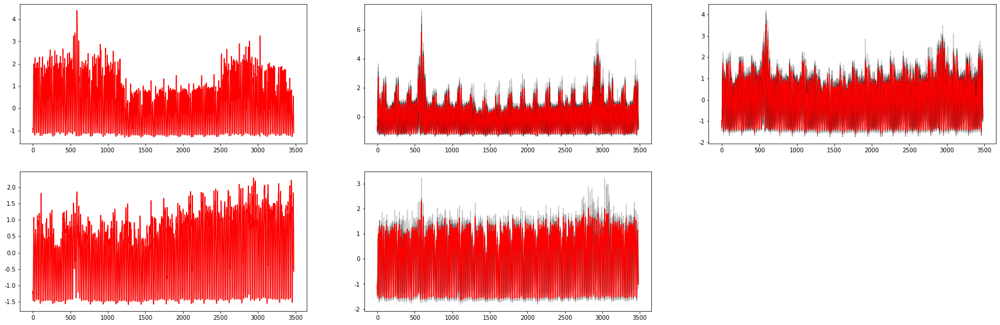

In [167]:
road_clustring_5 = road_clustering(t_dataset, n_clusters=5, verbose=False)

In [177]:
for key, values in road_clustring_5.items():
    print(f'cluster num : {key}  road nums : {len(values)} \n road : {values}\n')

cluster num : 2  road nums : 13 
 road : [('10', '경부선'), ('100', '남해선(순천-부산)'), ('121', '무안광주선'), ('150', '서해안선'), ('160', '울산선'), ('251', '호남선'), ('352', '중부선'), ('400', '평택제천선'), ('450', '중부내륙선'), ('500', '영동선'), ('1020', '남해1지선'), ('2510', '호남지선'), ('6000', '부산외곽선')]

cluster num : 1  road nums : 14 
 road : [('101', '남해선(영암-순천)'), ('120', '광주대구선'), ('140', '고창담양선'), ('200', '대구포항선'), ('201', '익산장수선'), ('270', '순천완주선'), ('300', '청주영덕선'), ('301', '당진대전선'), ('351', '통영대전선'), ('550', '중앙선'), ('600', '서울양양선'), ('650', '동해선(삼척-속초)'), ('652', '동해선(부산-포항)'), ('1510', '서천공주선')]

cluster num : 3  road nums : 1 
 road : [('370', '제2 중부선')]

cluster num : 4  road nums : 6 
 road : [('1000', '서울외곽순환선'), ('1040', '남해2지선'), ('1100', '제2경인선'), ('1200', '경인선'), ('4510', '중부내륙지선'), ('5510', '중앙선지선')]

cluster num : 0  road nums : 1 
 road : [('3000', '대전남부선')]



---

# Visualize all roads

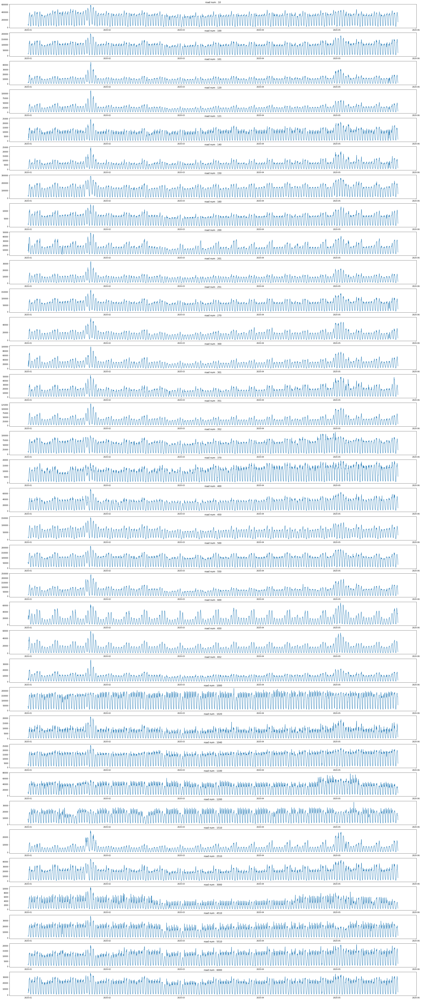

In [86]:
fig = plt.figure(figsize=(40, 100))
fig.tight_layout()

for i, (road_num, road_name) in enumerate(highway_info.items()):
    ax = fig.add_subplot(35, 1, i + 1)
    x, y = new_train['날짜'], new_train[road_num]
    ax.plot(x, y)
    ax.set_title(f'road num : {road_num}')

In [24]:
import matplotlib.dates as mdates

def create_timestamp(date):
    result = []
    
    for i in range(0, 24):
        result.append(date + ' ' + str(i).zfill(2) + ':00:00')
    
    return result

newyear = pd.DataFrame({
    'ds': pd.to_datetime(create_timestamp('2020-01-01')),
    'holiday': 'newyear'
})

seol = pd.DataFrame({
    'ds': pd.to_datetime(create_timestamp('2020-01-24') + create_timestamp('2020-01-25') + create_timestamp('2020-01-26')),
    'holiday': 'seol'
})

seol_alter = pd.DataFrame({
    'ds': pd.to_datetime(create_timestamp('2020-01-27')),
    'holiday': 'seol_alter'
})

day31 = pd.DataFrame({
    'ds': pd.to_datetime(create_timestamp('2020-03-01')),
    'holiday': 'day31'
})

election = pd.DataFrame({
    'ds': pd.to_datetime(create_timestamp('2020-04-15')),
    'holiday': 'election'
})

budda_day = pd.DataFrame({
    'ds': pd.to_datetime(create_timestamp('2020-04-30')),
    'holiday': 'budda_day'
})

children_day = pd.DataFrame({
    'ds': pd.to_datetime(create_timestamp('2020-05-05')),
    'holiday': 'children_day'
})


holidays = pd.concat((newyear, seol, seol_alter, day31, election, budda_day, children_day))


def plot_weekly(road):
    fig = plt.figure(figsize=(40, 40))
    start_idx, end_idx = 0, 168
    
    for i in range(1, 21):
        plt.subplot(21, 1, i)
        plt.plot(new_train['날짜'][start_idx:end_idx+1], new_train[road][start_idx:end_idx+1])
        
        plt.xticks(rotation=30)
        plt.title(f'{road}도로[{highway_info[road]}] {i}주차')
        start_idx += 168
        end_idx += 168
    
    
def plot_monthly(road):
    fig = plt.figure(figsize=(40, 40))
    fig.tight_layout()
    start_idx, end_idx = 0, 672
    
    for i in range(1, 5):
        ax = fig.add_subplot(5, 1, i)
        x, y = new_train['날짜'][start_idx:end_idx+1], new_train[road][start_idx:end_idx+1]
        ax.plot(x, y)
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
        ax.set_title(f'{road}도로[{highway_info[road]}] {i}월')
        start_idx += 672
        end_idx += 672
        
        
def cv_mean_rmse(road, params=None):
    new_df = pd.DataFrame({
        'ds':new_train['날짜'],
        'y':new_train[road]
    })
    if params is None:
        m = Prophet(holidays=holidays)
    else:
        m = Prophet(**params, holidays=holidays)
    m.fit(new_df)
    future = m.make_future_dataframe(periods=168, freq='H')
    forecast = m.predict(future)
    
    df_cv = cross_validation(m, initial='14 days', period='7 days', horizon='7 days')
    df_p = performance_metrics(df_cv)
    
    return m, forecast, df_p['rmse'].mean()
    

## 10 경부선

전반적으로 높은 통행량을 보이면서 편차가 큰 편 휴일 값의 영향을 받으나 크게 받는 것 같지는 않아보임

- no params rmse : 42750.10176858033
- params rmse : 48610.35053479041


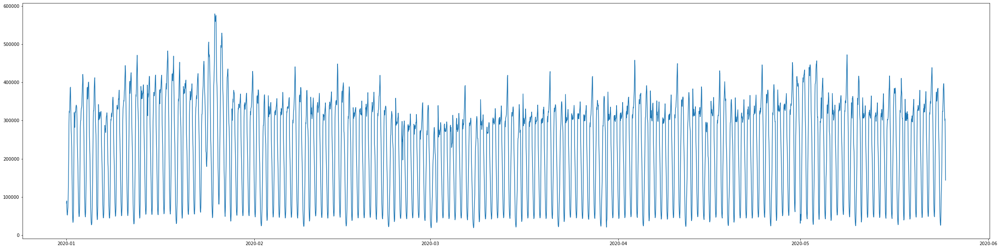

In [46]:
road = '10'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [49]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [50]:
print(rmse)

42750.10176858033


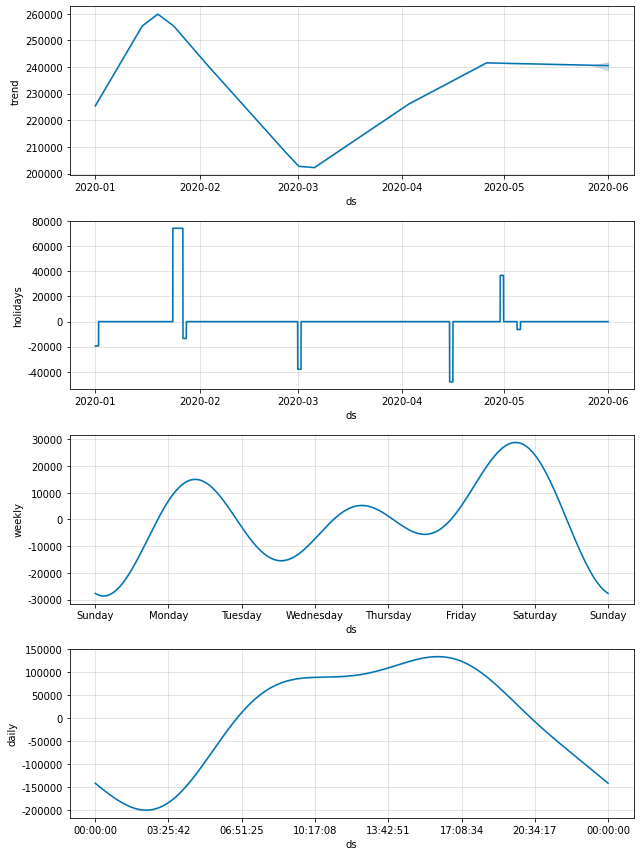

In [51]:
fig2 = m.plot_components(forcast)
fig2.

## 100 남해선(순천-부산)

- 경부선(10)과 비슷한 양상을 보임

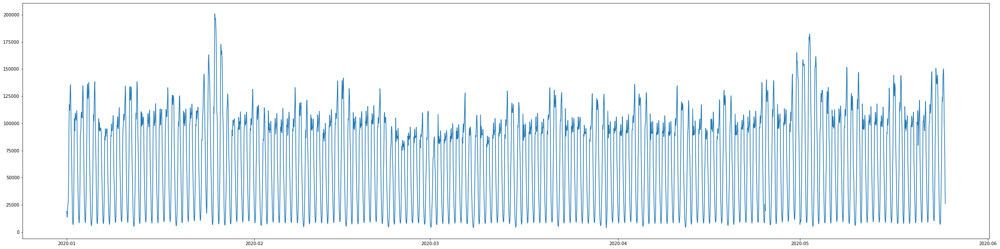

In [52]:
road = '100'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['100']) 

In [53]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -162.161
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       7711.56   0.000106262       133.122   1.287e-06       0.001      168  LS failed, Hessian reset 
      99       7711.57   0.000403833       107.487           1           1      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7712.52   9.55406e-05       69.8028           1           1      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     263       7712.75   0.000116746       152.678   7.806e-07       0.001      432  LS failed, Hessian reset 
     299       7712.97   0.000142882       71.5561     0.03885      0.6862      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     346       7712.98   1.45248e-07       56.6855      0.2589      0.7885      543   
Optimization terminat

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -47.3301
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       918.883   2.12118e-05       62.9929      0.5139      0.5139      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       918.905   0.000120035       96.9888    1.37e-06       0.001      220  LS failed, Hessian reset 
     175       918.912   7.02687e-08       66.1658      0.3106           1      278   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -31.6815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1336.48   6.31095e-06       54.5816      0.3381      0.3381      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148        1336.5   7.74194e-05       55.3244   8.945e-07       0.0

In [54]:
print(rmse)

15673.463609878887


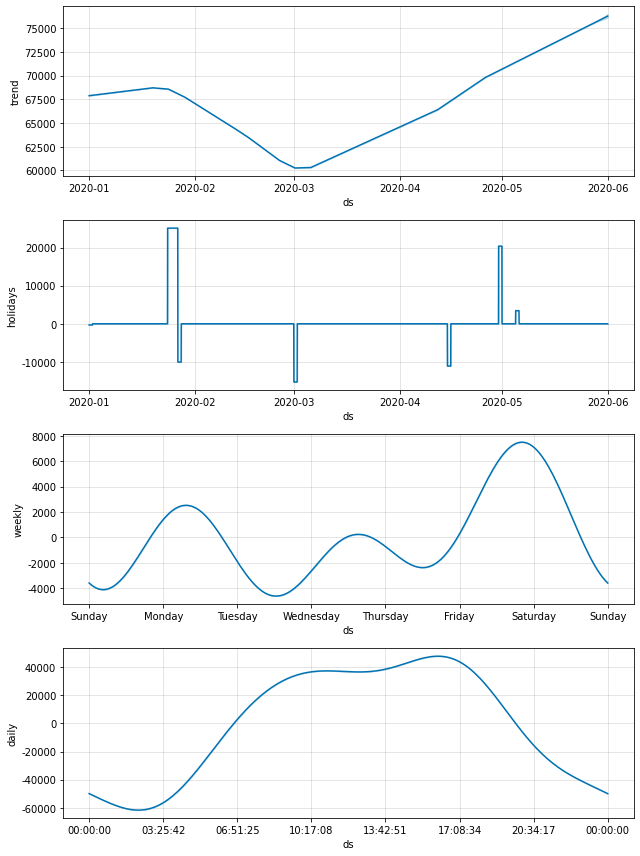

In [55]:
fig = m.plot_components(forcast)

## 101 남해선(영암-순천)

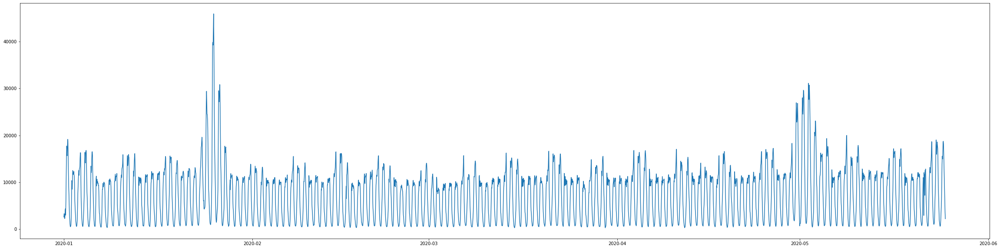

In [56]:
road = '101'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['101']) 

In [57]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -46.2335
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8695.15    0.00305985       413.444           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       8697.22   9.20248e-05       101.571           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       8697.26    3.3568e-05       59.9724           1           1      380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     327       8697.44    0.00173515       641.435   1.796e-05       0.001      454  LS failed, Hessian reset 
     399       8697.65   4.23362e-07       67.9185      0.4728      0.4728      552   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     401       8697.65   5.40041e-07    

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -31.8881
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        955.32   0.000159156       74.4901           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       955.559   7.14706e-06       81.6199           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     265       955.566   7.09776e-06       82.5288   9.155e-08       0.001      397  LS failed, Hessian reset 
     299       955.571    1.1219e-05       70.5598      0.3836           1      438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     374       955.572   2.54059e-07       63.6932           1           1      541   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probabil

In [58]:
print(rmse)

2877.615626592801


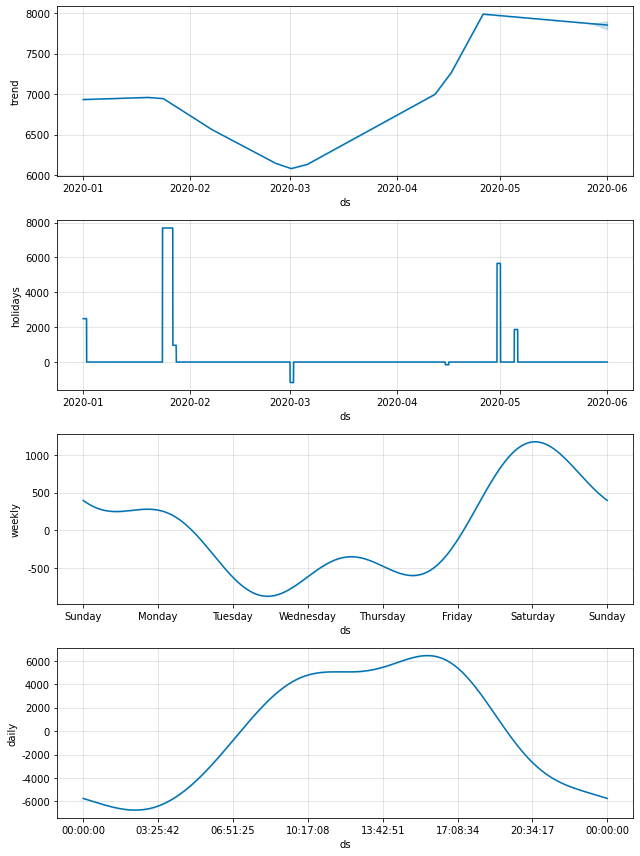

In [59]:
fig = m.plot_components(forcast)

## 120 광주대구선

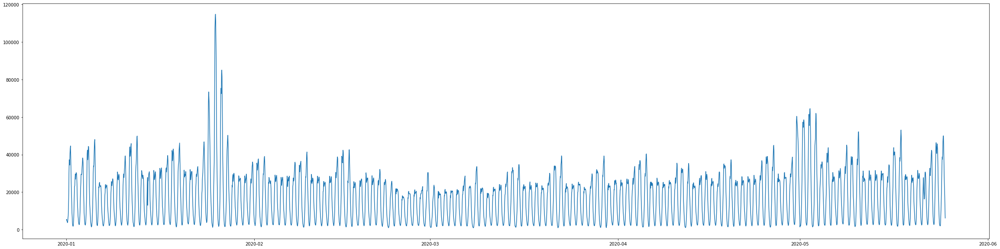

In [60]:
road = '120'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['120']) 

In [61]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -43.6134
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8752.82   0.000288515       330.249      0.1922      0.1922      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       8755.46   0.000565993       207.525      0.4139      0.4139      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       8756.22   6.92635e-05       61.3697      0.5764      0.5764      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       8756.24   7.12975e-05       145.559   9.475e-07       0.001      405  LS failed, Hessian reset 
     342       8756.27   2.48467e-07       70.6084      0.2565           1      457   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -31.9444
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       936.188   1.89793e-06       62.1508           1           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123        936.19   1.84905e-06       71.5677   2.463e-08       0.001      202  LS failed, Hessian reset 
     137        936.19   6.31511e-08       70.3846           1           1      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -13.7919
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1324.94   0.000702791        90.035           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       1324.95   5.14012e-05       77.5356   7.381e-07       0.0

In [62]:
print(rmse)

6501.388568339223


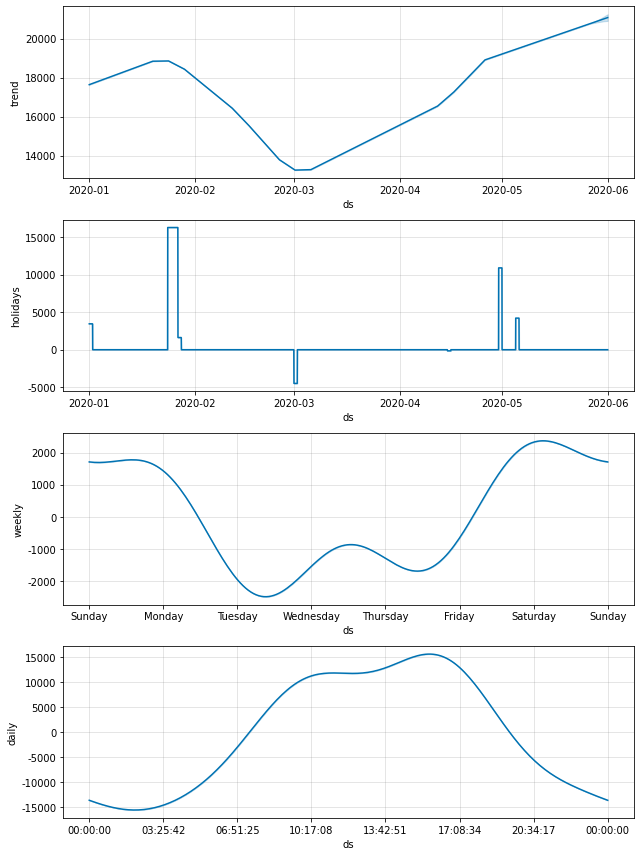

In [64]:
fig = m.plot_components(forcast)

## 121 무안광주선

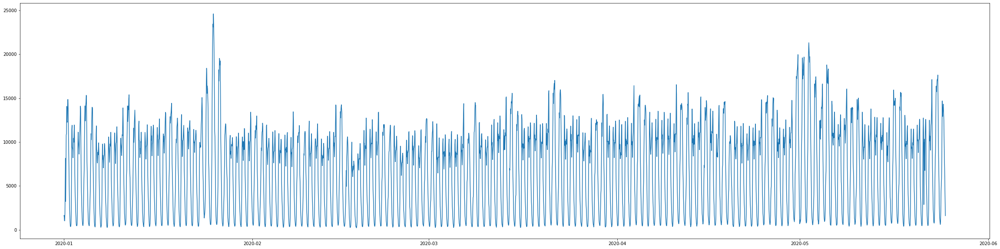

In [65]:
road = '121'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['121']) 

In [66]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -141.803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7422.16     0.0010717       93.6915      0.8372      0.8372      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7422.73   0.000881532       116.642      0.3052           1      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       7422.75   6.93038e-05       83.6934   7.356e-07       0.001      322  LS failed, Hessian reset 
     293       7422.94   6.00914e-07       68.9966      0.3188      0.8736      433   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -44.0446
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       877.385   6.93024e-07       74.3392      0.9293      0.9293      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       877.385   9.03294e-07       68.2827   1.411e-08       0.001      178  LS failed, Hessian reset 
     130       877.385   1.68721e-08       75.0566     0.06791           1      206   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -26.77
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1297.12   2.90532e-05       73.8135       0.368       0.368      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       1297.14   5.97174e-05       48.0535   8.129e-07       0.001

In [67]:
print(rmse)

1945.6801474358413


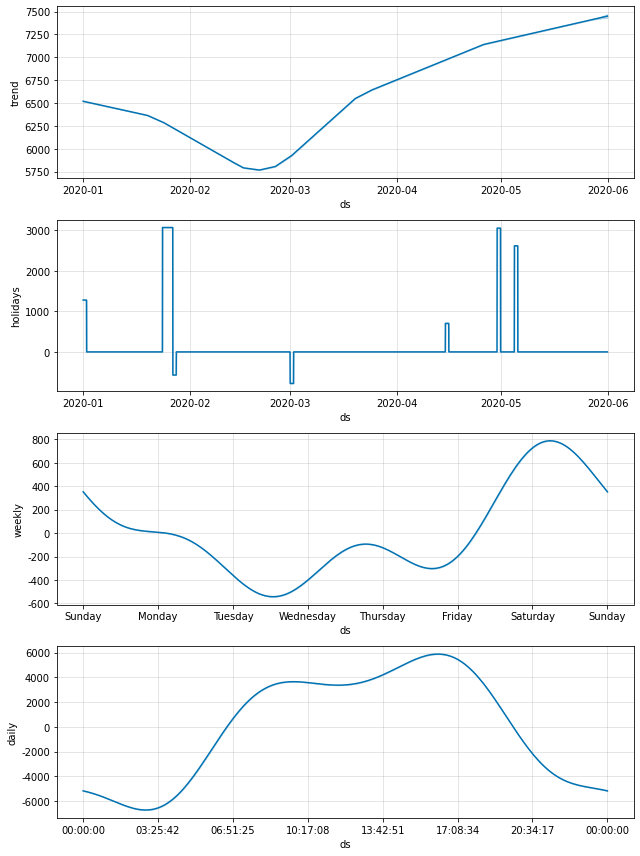

In [68]:
fig1 = m.plot_components(forcast)

## 140 고창담양선

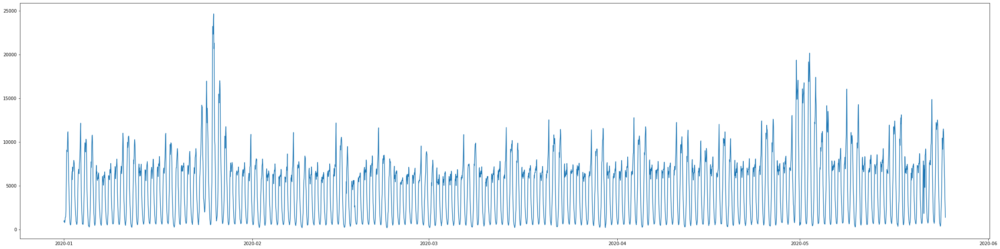

In [69]:
fig = plt.figure(figsize=(40, 10))
road = '140'
plt.plot(new_train['날짜'], new_train['140']) 

In [70]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -73.9642
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8016.66   0.000749256       185.762       0.997       0.997      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       8017.67   0.000412078       97.8143           1           1      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       8018.03   2.89778e-05       51.8722      0.8722      0.8722      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     329       8018.05   6.50211e-07       56.8027      0.1535      0.3776      438   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.7926
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       912.794    9.0784e-07       72.0382      0.2596      0.2596      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       912.795   3.06047e-06       79.0305   3.325e-08       0.001      182  LS failed, Hessian reset 
     131       912.795   2.37927e-08       80.1248      0.2447           1      202   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -14.5827
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1319.49   1.66991e-06       87.5061      0.9169      0.9169      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       1319.49   2.96115e-06       84.6958   3.608e-08       0.0

In [71]:
print(rmse)

1945.3012109739839


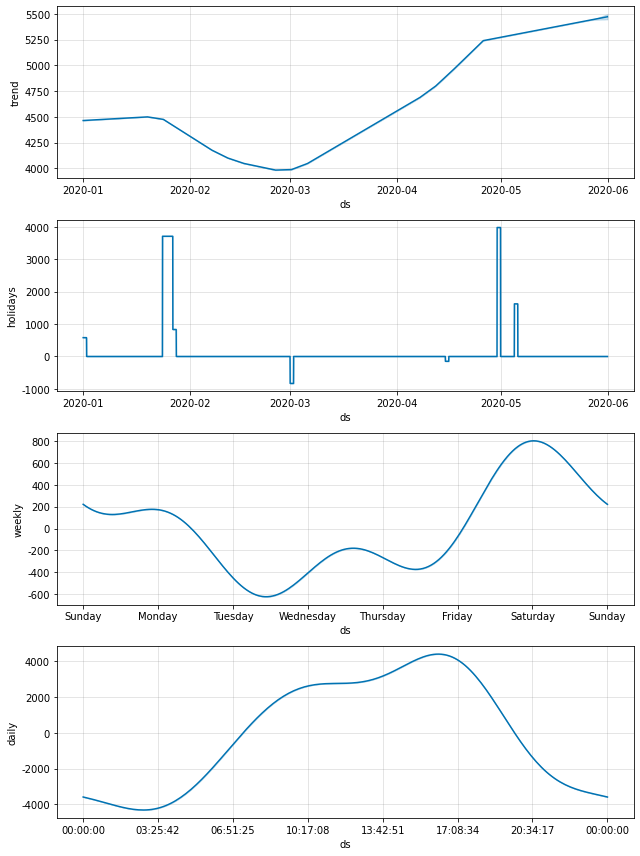

In [72]:
fig = m.plot_components(forcast)

## 150 서해안선
서해안고속도로 건설이 논의된 것은 1980년 초반이었으나 본격적으로 거론되어 구체화된 것은 1987년부터이다.
1988년 9월에 기본조사가 실시되고 이듬해인 1989년 12월에 인천 ~ 안산간 실시설계와 안산 ~ 목포간 기본설계가 동시에 착수되었다.
서해안고속도로 전구간 353km를 동시에 건설하기에는 재원 부족으로 불가능함에 따라 1990년 12월에 인천~안산간 착공을 시작으로, 1994년 7월 6일에 인천 ~ 안산간 27.6km를 개통하고, 1996년 12월 17일 안산 ~ 안중간 42.7km를 개통하였으며, 1998년 8월 25일에 무안 ~ 목포간 23.2km, 1998년 10월 30일에 서천 ~ 군산간 22.7km를 개통하였다. 이후 서해대교 및 송악 ~ 당진간 18.8km, 당진 ~ 서천간 103.7km, 군산 ~ 무안간 114.3km등에 대한 공사가 완료되어 2001년12월 21일 전구간이 개통되었다.
서해안고속도로는 기존의 경제개발축 상에 위치하지 않아 경부축에 비해 개발상태가 낙후되었으나 간척자원, 용수, 미개발 토지 등으로 개발 잠재력이 높은 서해안축을 개발함으로써 국토의 균형발전을 도모하고, 지리적으로 대외국과의 교류와 항만 및 공단개발에 유리한 입지조건을 갖추고 있어 서해안축 개발 필요성에 따라 건설되었다.

노선길이 : 340.8

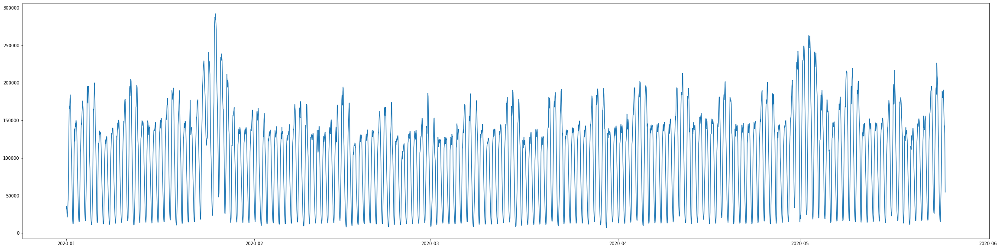

In [73]:
fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['150']) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 160 울산선 
울산고속도로(蔚山高速道路, 고속국도 제16호선)는 울산광역시 울주군을 기점으로, 울산광역시 남구를 종점으로 하여 동서를 잇는 대한민국의 고속도로이다. 대한민국에서 경인고속도로와 경부고속도로에 이어 세 번째로 개통되었다.
1962년 울산이 특정공업지구로 지정된 이후, 대단위 공업단지가 조성되면서 이들 공업단지의 수송로 확보를 위하여 건설되었다. 건설 당시에는 '언양-울산간 유료 도로'라는 이름의 지방도였으며, 건설자금은 전액 한신부동산주식회사에서 출자하였다. 시공은 현대건설이 맡았으며, 1969년 6월부터 6개월 간의 공사 끝에 완공되었다.
개통 이후 지금까지 울산 외곽을 통과하는 경부고속도로와 울산 시가지 및 공업단지를 연결하는 산업고속도로의 역할을 하고 있다. 고속도로 관리는 한국도로공사 울산지사에서 담당하고 있다. 하루 4만 여대가 왕복하며, 화물운송 차량의 이용률이 특히 높다. 최근에는 울산시민들의 통행료 부담이 심각해지자, 통행료 폐지 논쟁이 벌어지고 있다.

노선길이 : 14.3

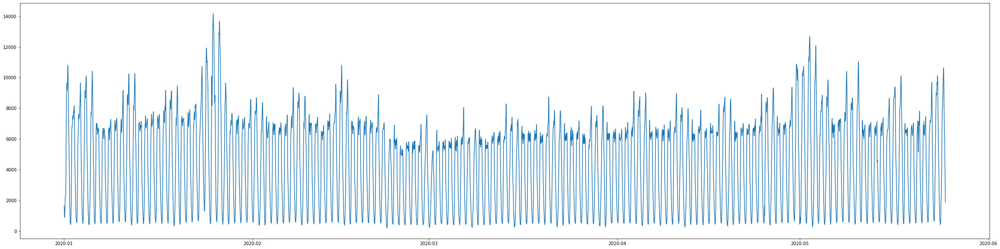

In [74]:
fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['160']) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 200 대구포항선

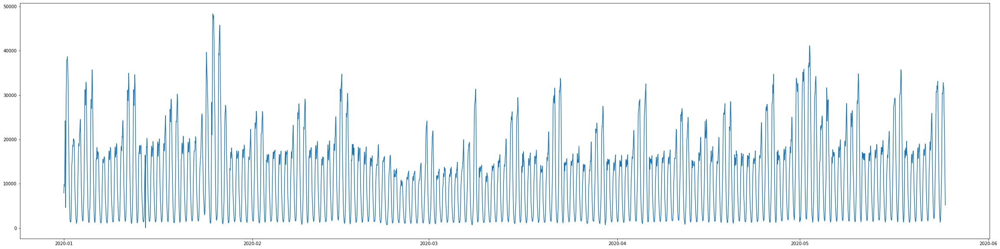

In [75]:
fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['200']) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 201 익선장수선

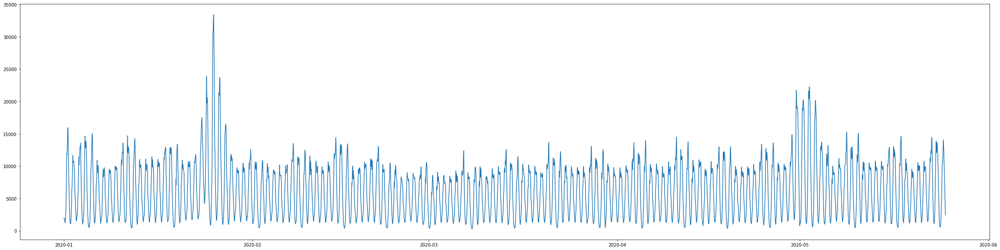

In [76]:
fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['201']) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 251 호남선

호남고속도로(湖南高速道路, 고속국도 제25호선의 일부)는 전라남도 순천시를 기점으로, 충청남도 논산시를 종점으로 하여 남북을 잇는 대한민국의 고속도로이다.
원래 대전광역시와 전라남도 순천시를 연결하는 고속도로를 부르는 이름이었으나, 2001년 고속국도 노선 지정 체계가 변경됨에 따라 논산시~순천시 구간만을 뜻한다. 논산 방향으로는 논산천안고속도로와 분기되며 호남고속도로지선으로 직결되고 순천 방향으로는 남해고속도로와 상호 직결되어 있다.
논산천안고속도로와 동일한 번호를 사용하고 있으므로 논산천안고속도로를 호남고속도로에 포함하기도 하나, 이전까지 호남고속도로의 본선이었던 호남고속도로지선을 호남고속도로라고도 한다.
최초 개통 당시에는 무료로 이용할 수 있었지만 고속도로 평균 통행량이 1만대를 넘긴 1978년 6월 1일부터 차관선인 세계은행과 협의를 거쳐 유료화되었다. 이로 인해 거의 모든 구간이 유료 구간이지만 광주광역시 구간 (광주 요금소~동광주 요금소)은 개방형 구간으로, 광주광역시내 구간은 무료로 이용할 수 있다. 이에 대한 우회 도로로는 장성 분기점~대덕 분기점 간의 고창담양고속도로가 있다.

노선길이 : 194.2  
	4차로
	8,6,4차로

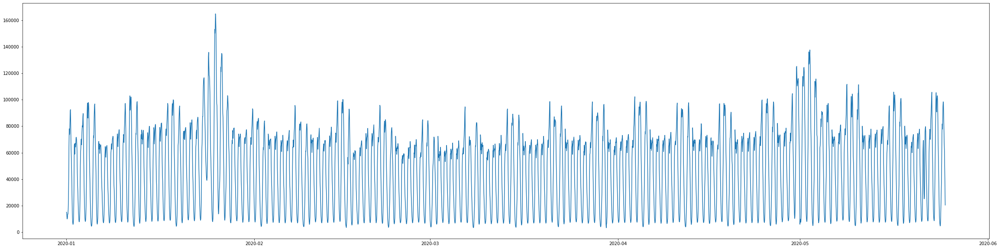

In [77]:
fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['251']) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 270 순천완주선

순천완주고속도로(順天完州高速道路, 고속국도 제27호선)는 전라남도 순천시를 기점으로, 전라북도 완주군을 종점으로 하여 호남 내륙지역을 연결하는 고속도로이다.
2004년에 착공하였으며, 2010년 부분 개통을 시작으로 2011년에 전 구간이 개통되었다.
기존의 철도와 일반국도로만 존재하였던 전주시-완주군-임실군-남원시-구례군-순천시-광양시 축의 노선을 고속도로로 이은 것으로 광주광역시로 우회하는 기존 노선의 호남고속도로를 보완하여 호남 내륙지역의 교통량의 분산과 호남 내륙 지역의 접근성을 높이는 기능을 담당하게 된다. 특히 고속도로가 통과하지 않았던 구례군, 임실군 일대에는 순천완주고속도로가 개통하게 되면서 고속도로 혜택을 제공받을 수 있게 되었으며, 광양, 순천, 여수 지역으로 가는 고속버스들이 논산천안고속도로 정안 휴게소 환승 터미널을 거쳐갈 수 있게 됐다.
도로의 종점이 각각 전주시와 광양시에 가까이 있으므로 전주광양고속도로로도 불린다.

노선길이 : 	117.8  
차선 : 	4차로

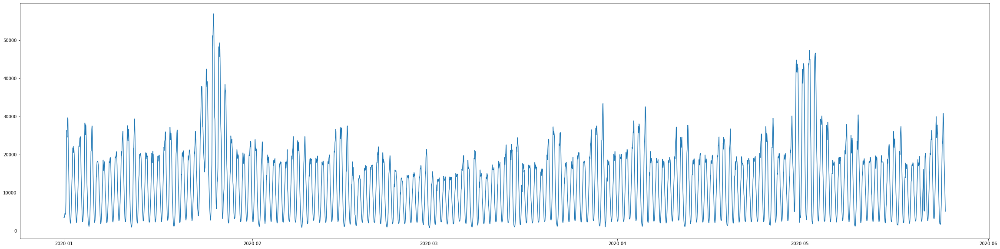

In [78]:
fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['270']) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 300 청주영덕선
당진영덕고속도로(唐津盈德高速道路, 고속국도 제30호선)는 충청남도 당진시을 기점으로. 경상북도 영덕군을 종점을 하는 대한민국의 고속도로이다.
2007년 11월 28일에 충청북도 청원군과 경상북도 상주시를 연결하는 청원상주고속도로가 개통되었고, 2009년 5월 28일에는 충청남도 당진군과 대전광역시를 1시간으로 연결하는 당진대전고속도로가 개통되었으며, 이 둘을 합쳐 당진상주고속도로라고 부른다.

노선길이: 	278.6

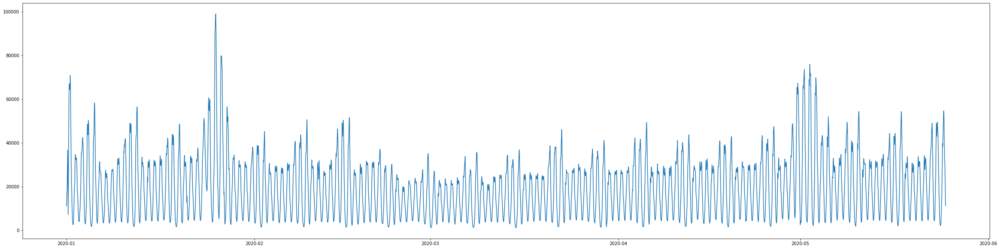

In [79]:
fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['300']) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 301 당진대전선

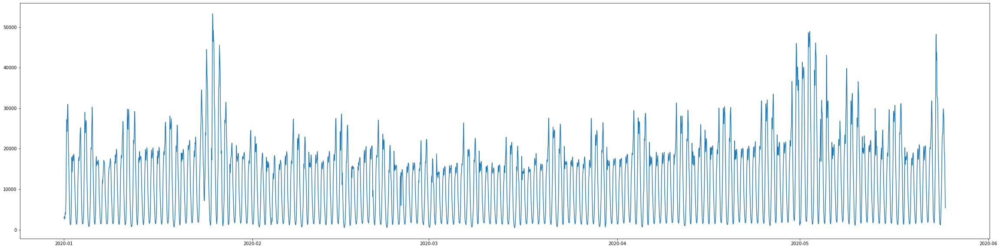

In [80]:
fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train['301']) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 351 통영대전선

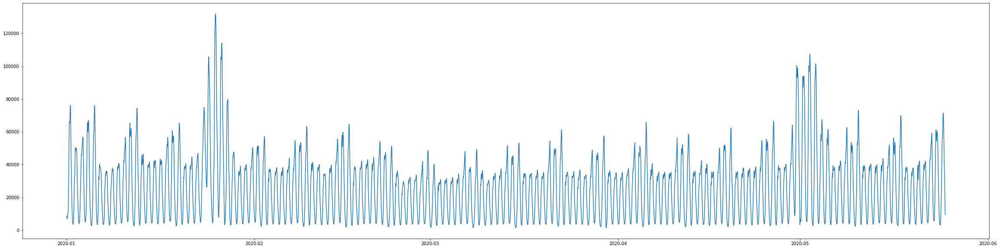

In [82]:
road = '351'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 352 중부선

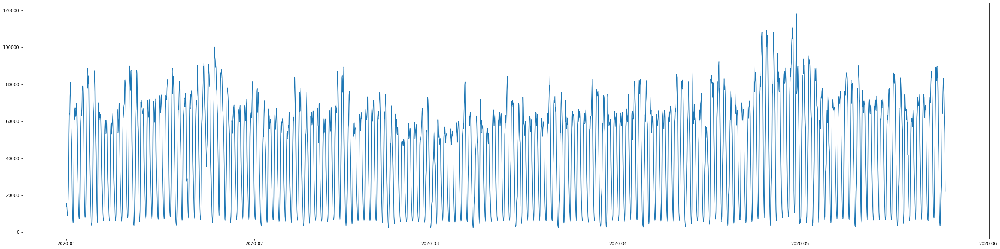

In [83]:
road = '352'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 370 제 2 중부선

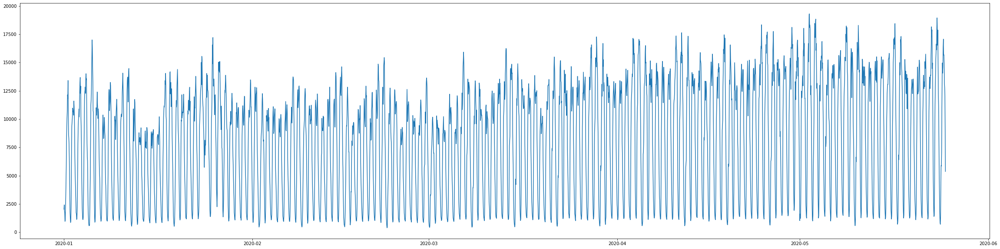

In [84]:
road = '370'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 400 평택제천선

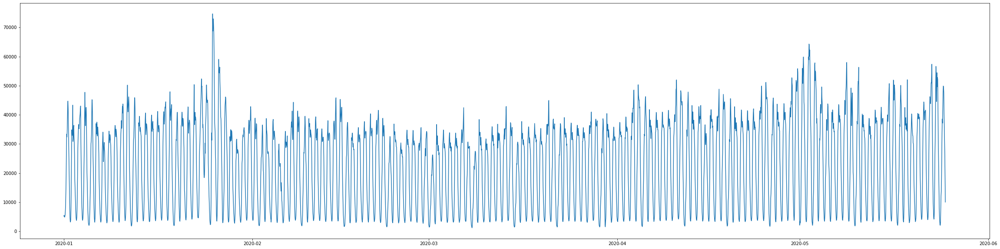

In [85]:
road = '400'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 450 중부내륙선

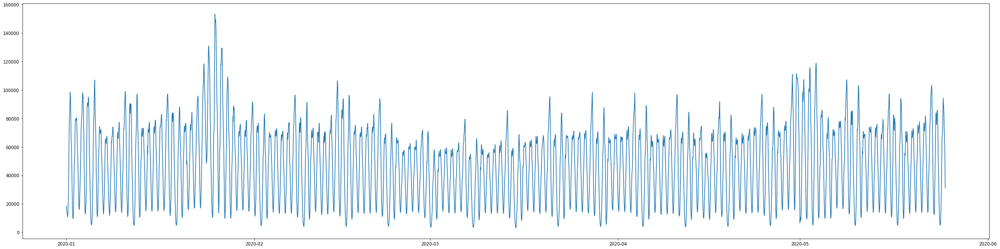

In [86]:
road = '450'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 500 영동선

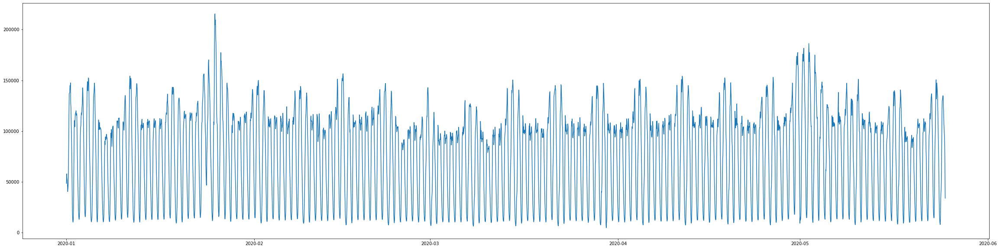

In [87]:
road = '500'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 550 중앙선

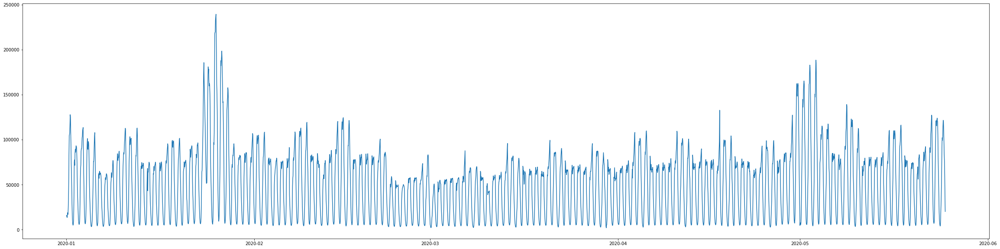

In [88]:
road = '550'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 600 서울양양선

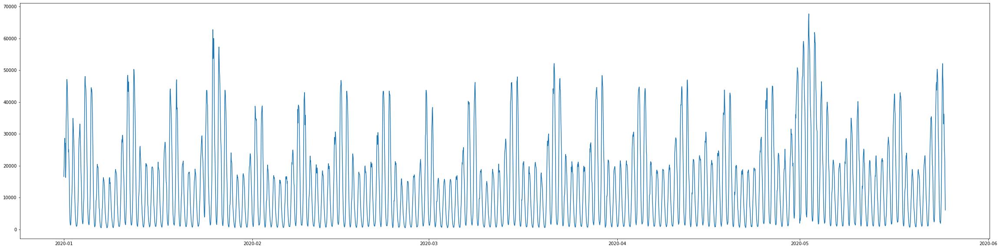

In [89]:
road = '600'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 650 동해안(삼척-속초)

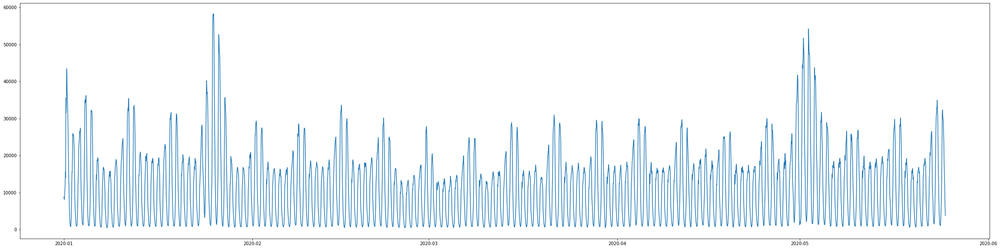

In [90]:
road = '650'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 652 동해선(부산-포함)

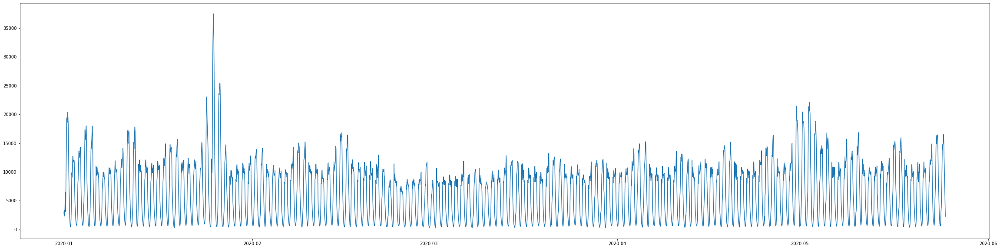

In [91]:
road = '652'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 1000 서울외곽순환선

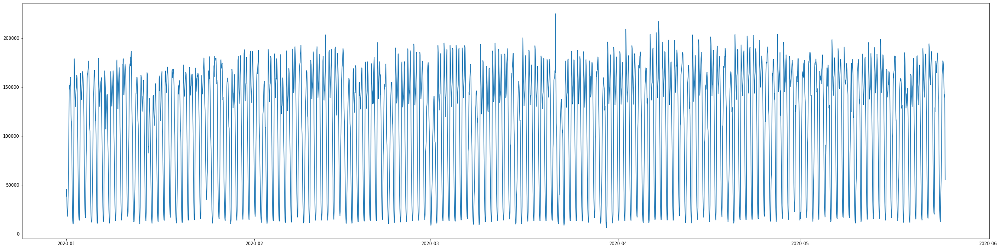

In [73]:
road = '1000'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [74]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -261.394
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6681.05   0.000113128       50.4767      0.4903      0.4903      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       6681.27   0.000409118       78.8848   5.369e-06       0.001      255  LS failed, Hessian reset 
     199       6681.33   9.41675e-07       62.3304           1           1      311   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       6681.33   2.76878e-07       59.3124      0.2722           1      313   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -47.2209
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       823.722   7.20168e-07       67.6342      0.6785      0.6785      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       823.724   1.45588e-05       81.5518   1.915e-07       0.001      197  LS failed, Hessian reset 
     144       823.725   2.81421e-08       78.8899      0.3327           1      235   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -50.505
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1097.3   2.49214e-06       71.1725      0.5637      0.5637      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145        1097.4   0.000452827       90.1154   5.533e-06       0.00

In [75]:
print(rmse)

20900.28955641299


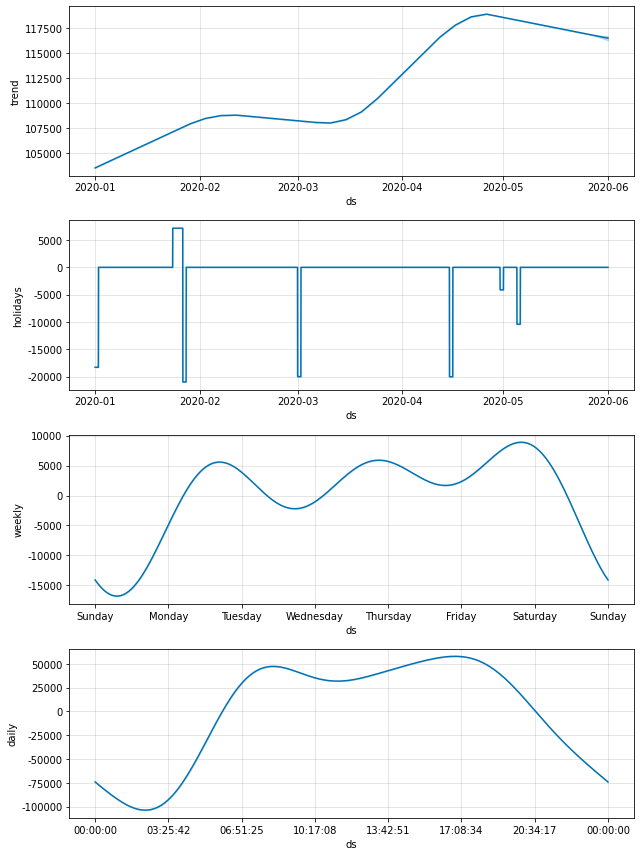

In [76]:
fig2 = m.plot_components(forcast)

## 1020 남해1지선

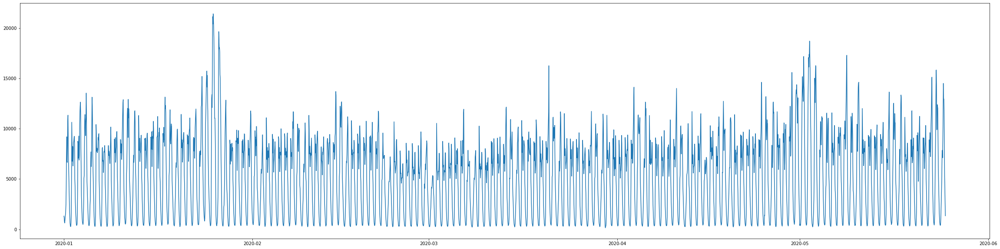

In [93]:
road = '1020'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 1040 남해2지선

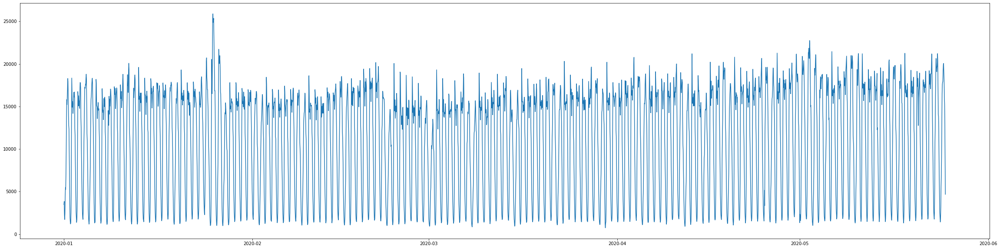

In [94]:
road = '1040'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 1100 제 2 경인선

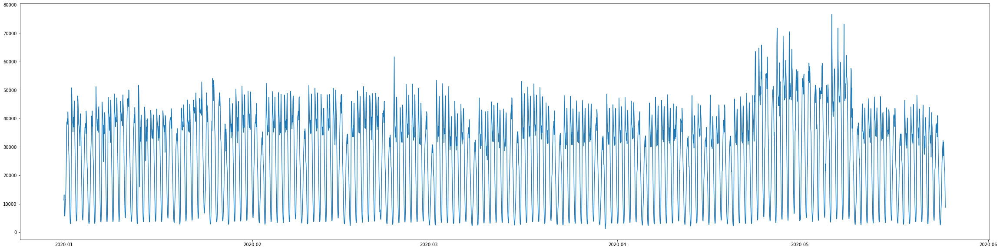

In [95]:
road = '1100'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 1200 경인선

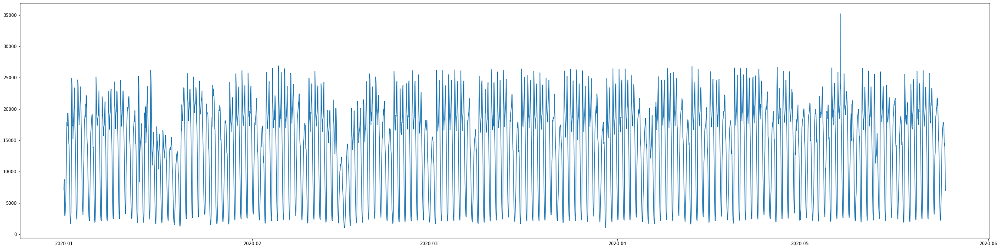

In [96]:
road = '1200'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 1510 서천공주선

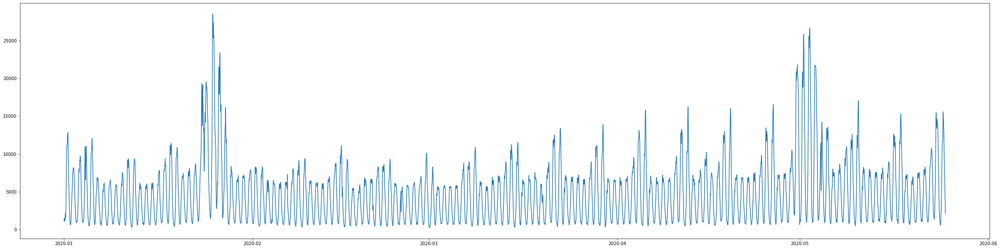

In [97]:
road = '1510'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 2510 호남지선

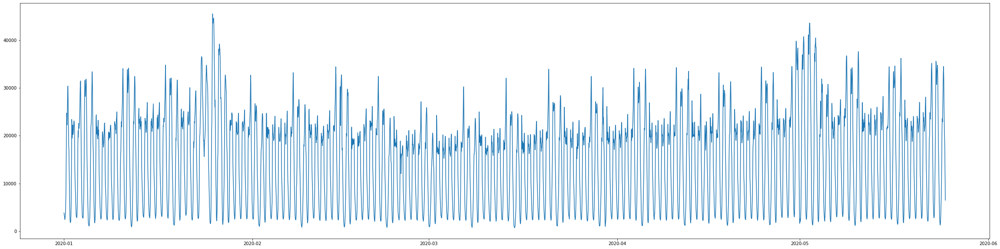

In [98]:
road = '2510'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 3000 대전남부선

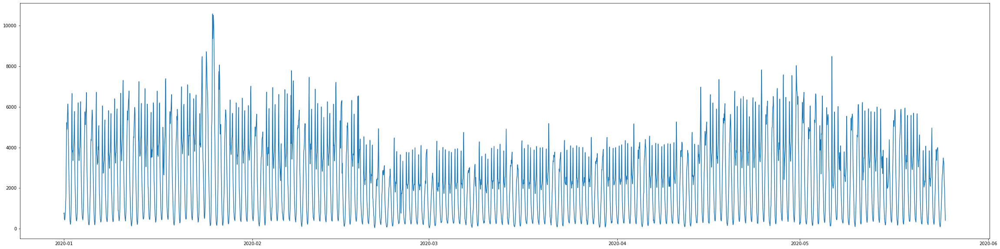

In [99]:
road = '3000'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 4510 중부내륙지선

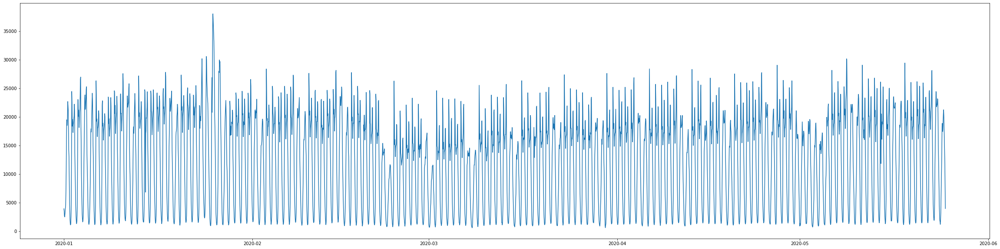

In [100]:
road = '4510'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 5510 중앙선지선

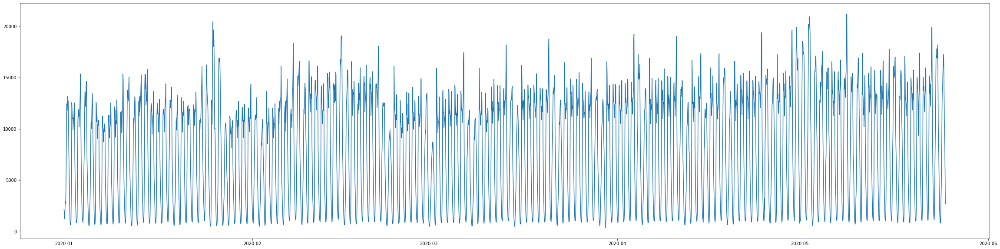

In [101]:
road = '5510'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)

## 6000 부산외곽선

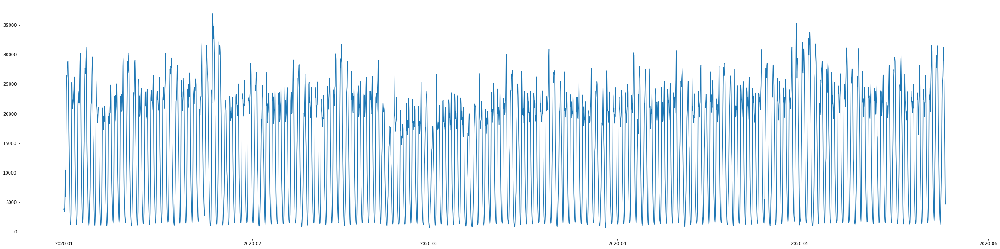

In [102]:
road = '6000'

fig = plt.figure(figsize=(40, 10))

plt.plot(new_train['날짜'], new_train[road]) 

In [ ]:
params = {}
m, forcast, rmse = cv_mean_rmse(road, params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -153.355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7777.95     0.0092645       223.282           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       7785.59   0.000140833       187.668   6.296e-07       0.001      246  LS failed, Hessian reset 
     199       7787.77    0.00171628       83.7154      0.4708      0.4708      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       7788.79   7.45734e-05       88.3835   4.502e-07       0.001      377  LS failed, Hessian reset 
     299       7790.18     0.0030088       245.602           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7790.61    0.00137216       278.119           1           1      591   
    Iter      log pro

INFO:fbprophet:Making 18 forecasts with cutoffs between 2020-01-19 23:00:00 and 2020-05-17 23:00:00


Initial log joint probability = -34.327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       973.497   9.30047e-05       68.9674      0.5357      0.5357      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       973.502   1.67096e-06       64.2367   2.205e-08       0.001      199  LS failed, Hessian reset 
     199       973.507   4.08297e-07       58.1713           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       973.507   9.68077e-07       70.1423   1.198e-08       0.001      359  LS failed, Hessian reset 
     221       973.507   2.16935e-08       70.1078      0.1505           1      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -28.7536
    Iter      log prob        ||dx||      ||grad||    

In [ ]:
print(rmse)

In [ ]:
fig2 = m.plot_components(forcast)